# Can a combination of MRI scans, screening test results, and demographics from the OASIS project be early predictors of the onset of dementia?
CKME136 <br />
Alexander Wong

## Import Libraries and Data

In [1]:
import pandas as pd # For reading data and data frames
import numpy as np # For data transformation and aggregation
import seaborn as sns; sns.set() # For plots
import matplotlib.pyplot as plt # For plots
import scipy.stats # For stats (e.g. normality test)
import pydotplus # For decision tree visualization
import random; random.seed(1) # Set randomizer seed to 1
from sklearn.cluster import KMeans # For k-Means clustering
from sklearn.feature_selection import VarianceThreshold # For low variance filter
from sklearn.feature_selection import SelectKBest # For univariate analysis
from sklearn.feature_selection import chi2 # For univariate analysis
from sklearn.model_selection import KFold, cross_val_score # For cross validation
from sklearn.linear_model import LogisticRegression # For logistic regression
# from sklearn.linear_model import LinearRegression # For linear regression
from sklearn.naive_bayes import GaussianNB # For Naive Bayes classifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz # For decision tree classifier
from IPython.display import Image # For decision tree visualization
from sklearn.ensemble import RandomForestClassifier # For random forest classifier
from sklearn.datasets import make_classification # For random forest classifier
from sklearn.neighbors import KNeighborsClassifier # For k nearest neighbor classifier
from sklearn.metrics import confusion_matrix # For confusion matrix
from sklearn.metrics import classification_report # For classification report
from sklearn.metrics import roc_auc_score, roc_curve # For ROC curve
# from sklearn.metrics import accuracy_score # For measuring accuracy
from scipy.stats import friedmanchisquare # For Friendman test

print('Libraries loaded.')

Libraries loaded.


In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false; // disables auto-scroll for large visualizations
}

<IPython.core.display.Javascript object>

In [3]:
# Load Data Frames
ol = pd.read_csv('C:\\Users\\thewo\\documents\\CKME136Capstone\\oasis_longitudinal.csv')
oc = pd.read_csv('C:\\Users\\thewo\\documents\\CKME136Capstone\\oasis_cross-sectional.csv')
print('Oasis Longitudinal Preview:')
ol.head()

Oasis Longitudinal Preview:


,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,OAS2_0001,OAS2_0001_MR1,Nondemented,1,0,M,R,87,14,2.0,27.0,0.0,1987,0.696,0.883
1,OAS2_0001,OAS2_0001_MR2,Nondemented,2,457,M,R,88,14,2.0,30.0,0.0,2004,0.681,0.876
2,OAS2_0002,OAS2_0002_MR1,Demented,1,0,M,R,75,12,NaN,23.0,0.5,1678,0.736,1.046
3,OAS2_0002,OAS2_0002_MR2,Demented,2,560,M,R,76,12,NaN,28.0,0.5,1738,0.713,1.010
4,OAS2_0002,OAS2_0002_MR3,Demented,3,1895,M,R,80,12,NaN,22.0,0.5,1698,0.701,1.034


In [4]:
print('Oasis Cross-sectional Preview:')
oc.head()

Oasis Cross-sectional Preview:


,ID,M/F,Hand,Age,Educ,SES,MMSE,CDR,eTIV,nWBV,ASF,Delay
0,OAS1_0001_MR1,F,R,74,2.0,3.0,29.0,0.0,1344,0.743,1.306,NaN
1,OAS1_0002_MR1,F,R,55,4.0,1.0,29.0,0.0,1147,0.810,1.531,NaN
2,OAS1_0003_MR1,F,R,73,4.0,3.0,27.0,0.5,1454,0.708,1.207,NaN
3,OAS1_0004_MR1,M,R,28,NaN,NaN,NaN,NaN,1588,0.803,1.105,NaN
4,OAS1_0005_MR1,M,R,18,NaN,NaN,NaN,NaN,1737,0.848,1.010,NaN


***Note: Due to the quantity of missing values in the cross-sectional data set, focus will be primarily on the longitudinal dataset.***

## Step 1: Initial Analysis

In this step, a detailed analysis of each attribute will be done to provide a better understanding of the meaning of each field. Incorrect data types, outliers, missing values, errors, attributes with low variances and imbalances in the data will be identified. The inconsistencies identified will then be treated either in this step or following steps. Relationships between attributes will also be explored, in order to understand whether there are correlations in the source data.

### Attribute Descriptions
**Subject ID:** Unique identifier for each subject being tested. <br />
**MRI ID:** Unique identifier for each MRI scanning session. <br />
**\*Group:** Label given to the subject as having dementia (labeled "Demented"), not having dementia (labeled "Nondemented"), or being converted from nondemented to demented (labeled "Converted"). This is the class variable for this project. <br />
**Visit:** The visit number for each MRI scanning session. <br />
**MR Delay:** The delay from a patient's first visit (days). <br />
**M/F:** Male or Female. <br />
**Hand:** Right handed or left handed. <br />
**Age:** Age at the time the MRI scan was acquired (years) (Marcus et al., 2010) <br />
**EDUC:** Years of education. <br />
**SES:** Socioeconomic status. This is based on the Hollingshead Index of Social Position. Categories: 1 (highest status) to 5 (lowest status) (Marcus et al., 2010) <br />
**MMSE:** Mini-Mental State Examination score (0 = worst to 30 = best) (Marcus et al., 2010) <br />
**CDR:** Clinical Dementia Rating (0 = no dementia, 0.5 = very mild dementia, 1= mild dementia, 2= moderate dementia) (Marcus et al., 2010) <br />
**eTIV:** Estimated total intracranial volume (cm^3) (Marcus et al., 2010) <br />
**nWBV:** Normalized whole-brain volume (expressed as a percentage of gray or white matter in the image processed)(Marcus et al., 2010) <br />
**ASF:** Atlas scaling factor (unitless). This field is calculated and is based on eTIV. It is a scaling factor that normalizes brain sizes to a specific target (i.e., the determinant of the transformation matrix) (Marcus et al., 2010)

\**Group is the class variable for this project*

In [5]:
# Brief description of the data
ol.describe()

,Visit,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
count,373.000000,373.000000,373.000000,373.000000,354.000000,371.000000,373.000000,373.000000,373.000000,373.000000
mean,1.882038,595.104558,77.013405,14.597855,2.460452,27.342318,0.290885,1488.128686,0.729568,1.195461
std,0.922843,635.485118,7.640957,2.876339,1.134005,3.683244,0.374557,176.139286,0.037135,0.138092
min,1.000000,0.000000,60.000000,6.000000,1.000000,4.000000,0.000000,1106.000000,0.644000,0.876000
25%,1.000000,0.000000,71.000000,12.000000,2.000000,27.000000,0.000000,1357.000000,0.700000,1.099000
50%,2.000000,552.000000,77.000000,15.000000,2.000000,29.000000,0.000000,1470.000000,0.729000,1.194000
75%,2.000000,873.000000,82.000000,16.000000,3.000000,30.000000,0.500000,1597.000000,0.756000,1.293000
max,5.000000,2639.000000,98.000000,23.000000,5.000000,30.000000,2.000000,2004.000000,0.837000,1.587000


### Data Types

The raw data types from the source longitudinal data will be determined. Data types will be reviewed for each field and converted accordingly. The data types important to this research are:
- object (text)
- category (factors)
- int64 (integers)
- float64 (decimals)

#### List raw data types

In [6]:
print(ol.dtypes)

Subject ID     object
MRI ID         object
Group          object
Visit           int64
MR Delay        int64
M/F            object
Hand           object
Age             int64
EDUC            int64
SES           float64
MMSE          float64
CDR           float64
eTIV            int64
nWBV          float64
ASF           float64
dtype: object


Subject ID and MRI ID are identifiers containing alphanumeric characters, so they will remain as objects. Group is the class variable so it will need to be treated as a category. Visit is a running count and MR Delay is a measurement in days, so they can remain as integers. M/F and Hand are categorical and can each have a possibility of 2 values, so they will be treated as categories. Age and EDUC can remain as integers as they are measurements in years. SES can only have 5 possible values so it could be treated as a category, but we may want to aggregate this field, so it will remain as a number. MMSE can be a discrete value ranging from 1-30 so it will be converted to a number. CDR, nWBV and ASF are measured with decimals so they can be kept as floats. eTIV is measured in centimeters cubed so it can be left as an integer.

#### Convert data types
At this point, we will also convert our categorical attributes to numerical levels. 
- Group -> 0 Nondemented, 1 Demented, 2 Converted
- M/F -> 0 Male, 1 Female
- Hand -> 0 Right, 1 Left

In [7]:
# Save as a new dataframe
ol_newtype = ol.copy()

# Alter levels
ol_newtype.loc[ol_newtype['Group']=='Nondemented', 'Group'] = '0'
ol_newtype.loc[ol_newtype['Group']=='Demented', 'Group'] = '1'
ol_newtype.loc[ol_newtype['Group']=='Converted', 'Group'] = '2'

ol_newtype.loc[ol_newtype['M/F']=='M', 'M/F'] = '0'
ol_newtype.loc[ol_newtype['M/F']=='F', 'M/F'] = '1'

ol_newtype.loc[ol_newtype['Hand']=='R', 'Hand'] = '0'
ol_newtype.loc[ol_newtype['Hand']=='L', 'Hand'] = '1'

# Convert data types
ol_newtype['Group'] = ol_newtype['Group'].astype('category')
ol_newtype['M/F'] = ol_newtype['M/F'].astype('category')
ol_newtype['Hand'] = ol_newtype['Hand'].astype('category')
ol_newtype['SES'] = ol_newtype['SES'].astype('float64')
ol_newtype['MMSE'] = ol_newtype['MMSE'].astype('float64')
print(ol_newtype.dtypes)

Subject ID      object
MRI ID          object
Group         category
Visit            int64
MR Delay         int64
M/F           category
Hand          category
Age              int64
EDUC             int64
SES            float64
MMSE           float64
CDR            float64
eTIV             int64
nWBV           float64
ASF            float64
dtype: object


### Missing Data

The next stage of the initial analysis requires us to look for missing values in the dataset. The heatmap below shows that SES and MMSE contain null values. When encountering missing values, the record can be removed entirely or the missing value can be filled with the mean, median or mode of the attribute in question. In the case of SES and MMSE, we will attempt to fill the null values.

Subject ID     0
MRI ID         0
Group          0
Visit          0
MR Delay       0
M/F            0
Hand           0
Age            0
EDUC           0
SES           19
MMSE           2
CDR            0
eTIV           0
nWBV           0
ASF            0
dtype: int64

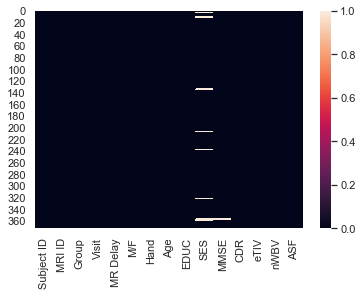

In [8]:
sns.heatmap(ol_newtype.isnull(), vmin=0, vmax=1) # Generate heatmap
ol_newtype.isna().sum() # Generate table of nulls

#### Median SES values
For missing SES values, the median value based on years of education will be used in its place. There is an assumption being made here that the socioeconomic status of a subject is related to the years of education. This is in hopes of populating a more realistic value than just a simple median. Filtering the dataset for null SES values results in two groups: 

In [9]:
ol_null_ses = ol_newtype[ol_newtype['SES'].isna()]
print(list(set(ol_null_ses['EDUC']))) # distinct list of EDUC

[16, 12]


The output of the code shows that records with null SES values are from subjects with 12 and 16 years of education. The next step is to determine the median values for these categories. It turns out that the median SES for subjects with 12 years of education is 3. The median for subjects with 16 years of education is 2.

In [10]:
median_12 = ol_newtype.loc[ol_newtype['EDUC']==12,'SES'].median(skipna=True)
print('Education 12 years median:', median_12)
median_16 = ol_newtype.loc[ol_newtype['EDUC']==16,'SES'].median(skipna=True)
print('Education 16 years median:', median_16)

Education 12 years median: 3.0
Education 16 years median: 2.0


#### Median MMSE value
For MMSE, an overall median will be determined and used to replace the null values.

In [11]:
median_mmse = ol_newtype['MMSE'].median(skipna=True)
print('MMSE median:', median_mmse)

MMSE median: 29.0


#### Replace nulls with medians
In the step below, we replace missing SES values with either 3 (12 years of education) or 2 (16 years of education), and missing MMSE values with 29. Based on the new heatmap, we can see that there are no longer any missing values.

Subject ID    0
MRI ID        0
Group         0
Visit         0
MR Delay      0
M/F           0
Hand          0
Age           0
EDUC          0
SES           0
MMSE          0
CDR           0
eTIV          0
nWBV          0
ASF           0
dtype: int64

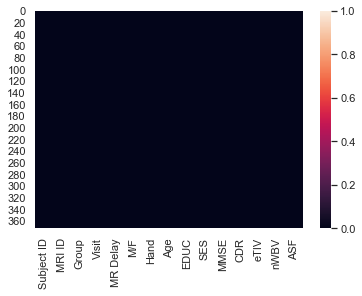

In [12]:
ol_fillna = ol_newtype.copy() # Create a copy of data frame

# Fill missing values
ol_fillna.loc[ol_fillna['EDUC']==12, 'SES'] = ol_fillna.loc[ol_fillna['EDUC']==12, 'SES'].fillna(median_12)
ol_fillna.loc[ol_fillna['EDUC']==16, 'SES'] = ol_fillna.loc[ol_fillna['EDUC']==16, 'SES'].fillna(median_16)
ol_fillna['MMSE'] = ol_fillna['MMSE'].fillna(median_16)

sns.heatmap(ol_fillna.isnull(), vmin=0, vmax=1) # Generate Heatmap
ol_fillna.isna().sum() # Generate table of nulls

### Further Errors and Inconsistencies

A visual scan of the Subject ID and MRI ID show that there are no obvious errors or inconsistencies. Printing a list of distinct values for the two categorical attributes, Group and M/F, also return the expected results. It should be noted that further inconsistencies could surface at later points of the analysis. 

In [13]:
print(list(set(ol_fillna['Group'])))

['2', '0', '1']


In [14]:
print(list(set(ol_fillna['M/F'])))

['0', '1']


### Outliers Analysis

#### Boxplots

Boxplots help to visualize the distribution of data points for a given numerical attribute. Boxplots summarize the median, first quartile, third quartile, and minimum/maximum value of the data points within 1.5 times the interquartile range (third quartile - first quartile). The boxplot can be used to locate data points that vary from the rest, commonly referred to as outliers. These are typically values that lie outside the minimum/maximum range on the graph. In this exercise, boxplots will be generated for all integer and float attributes.

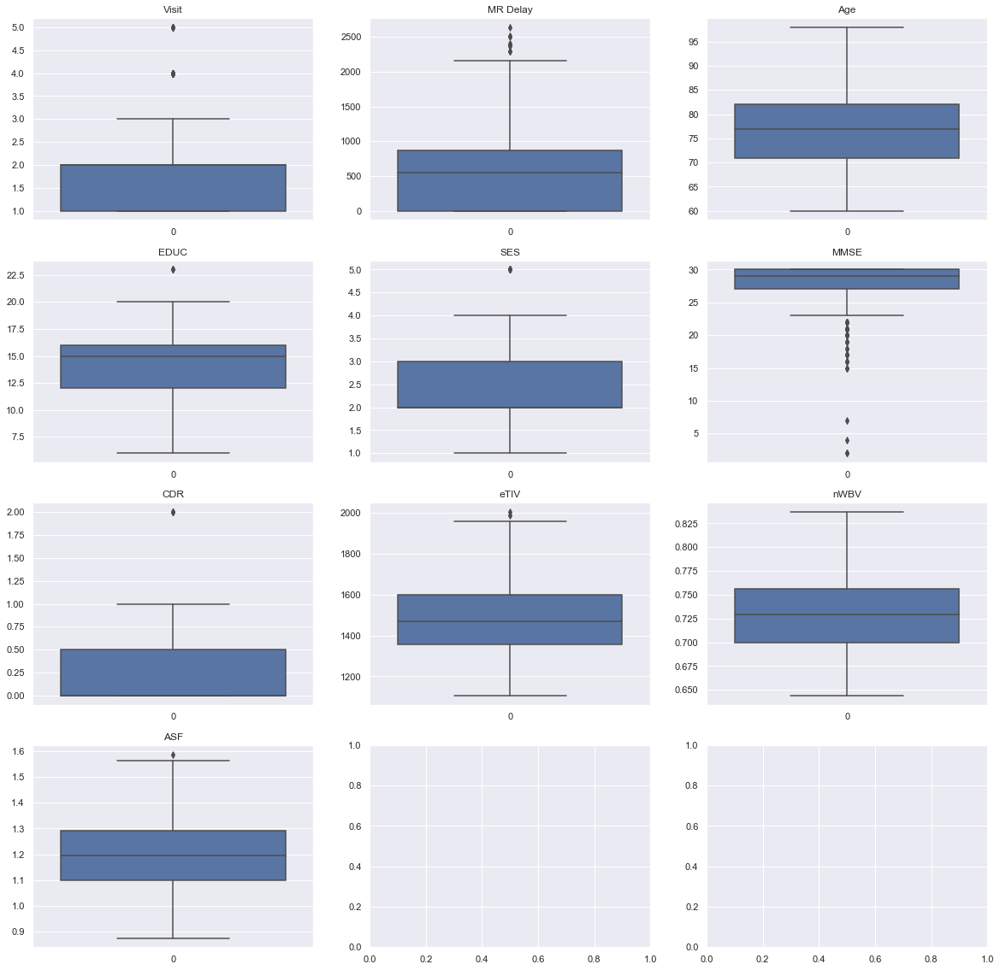

In [15]:
# Create the subplot
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))

# Create boxplots of each attribute and set on the subplot
b1 = sns.boxplot(data = ol_fillna['Visit'], ax=axes[0,0])
b1.title.set_text('Visit')
b2 = sns.boxplot(data = ol_fillna['MR Delay'], ax=axes[0,1])
b2.title.set_text('MR Delay')
b3 = sns.boxplot(data = ol_fillna['Age'], ax=axes[0,2])
b3.title.set_text('Age')
b4 = sns.boxplot(data = ol_fillna['EDUC'], ax=axes[1,0])
b4.title.set_text('EDUC')
b5 = sns.boxplot(data = ol_fillna['SES'], ax=axes[1,1])
b5.title.set_text('SES')
b6 = sns.boxplot(data = ol_fillna['MMSE'], ax=axes[1,2])
b6.title.set_text('MMSE')
b7 = sns.boxplot(data = ol_fillna['CDR'], ax=axes[2,0])
b7.title.set_text('CDR')
b8 = sns.boxplot(data = ol_fillna['eTIV'], ax=axes[2,1])
b8.title.set_text('eTIV')
b9 = sns.boxplot(data = ol_fillna['nWBV'], ax=axes[2,2])
b9.title.set_text('nWBV')
b10 = sns.boxplot(data = ol_fillna['ASF'], ax=axes[3,0])
b10.title.set_text('ASF')

With the boxplots, it can be visually determined that the following attributes may have outliers:
- Visit
- EDUC
- SES
- MMSE
- CDR

In order to confirm our suspicions, histograms can be used to gain an alternate perspective on these attributes.

#### Histograms

Histograms are another visual used to look at the distribution of data points of an attribute. Histograms plot the frequency of occurrences for each value of a numerical attribute. Compared to boxplots, one can more clearly see the distribution of an attribute. Histograms will be used to validate the attributes that we believe have outliers.

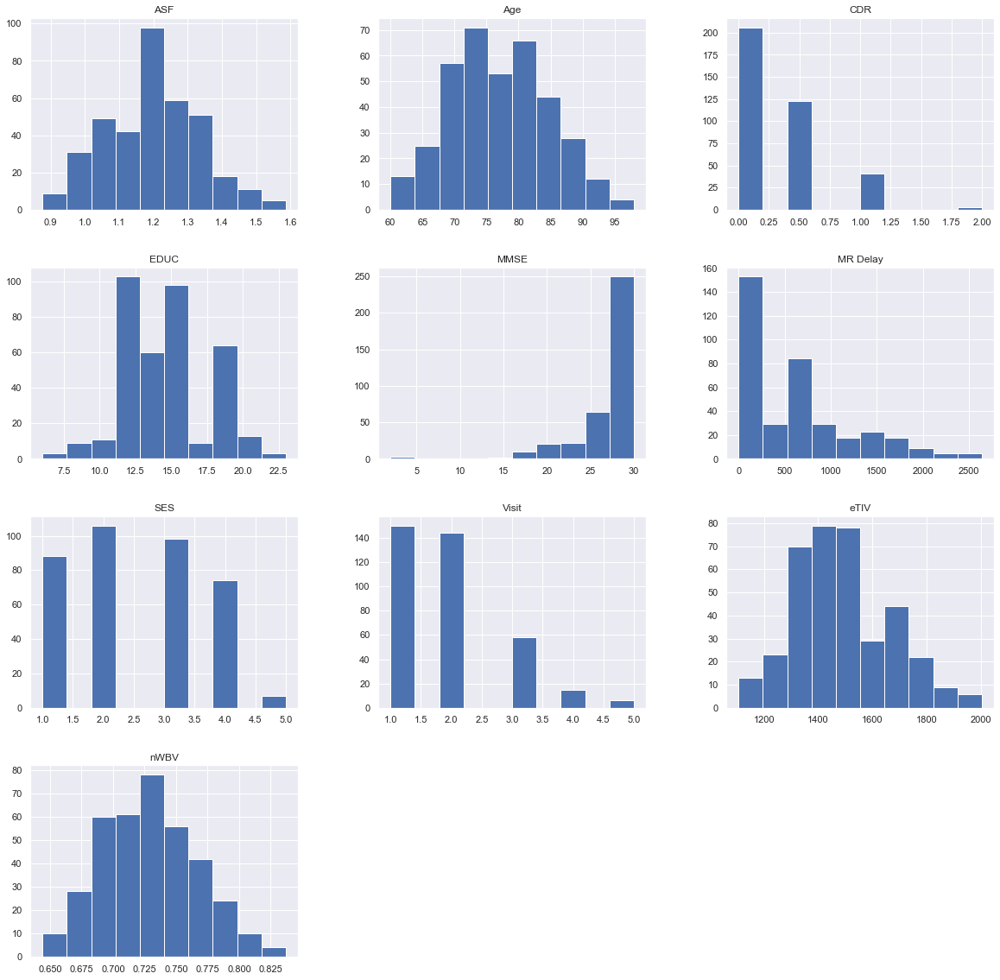

In [16]:
# Create histograms
histograms = ol_fillna.hist(layout=(4,3), figsize=(20,20))

Further analysis with the histograms indicate that there is no sufficient evidence proving the existence of outliers. This is because none of the data points fall significantly far from their distributions. Therefore, the decision has been made not to remove any values that were previously believed to be outliers.

### Class Variable Imbalance
The purpose of this step is to determine whether there is an imbalance in the class variable, Group. The goal is to determine whether there are significantly more records of one value over another. Since there are only 3 possible classes, an imbalance can be easily visualized and determined with a pie chart and/or pivot table.

In [17]:
class_imbalance = pd.pivot_table(ol_fillna, index='Group', values='MRI ID', aggfunc=len)
class_imbalance

,MRI ID
Group,
0,190
1,146
2,37


Pie Chart:


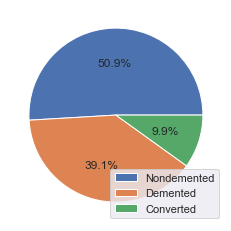

In [18]:
print('Pie Chart:')

pivot = class_imbalance.reset_index() # Convert pivot table to a data frame
labels = ['Nondemented', 'Demented', 'Converted'] # pivot.loc[:,'Group']
values = pivot.loc[:,'MRI ID']
patches, text, lab = plt.pie(values, autopct='%.1f%%') # Create the pie chart with value labels
plt.legend(patches, labels, loc='lower right') # Create legend
plt.show()

Considering that the 'Converted' subjects are technically 'Demented', it can be said that the class variable is balanced (183 Demented vs. 190 Nondemented). Therefore, no balancing is required. In later steps, we may want to re-label 'Converted' subjects to 'Demented'.

### Bivariate Analysis
The purpose of the bivariate analysis is to identify pairwise relationships between 2 variables. The most common practice in this step is to look at scatter plots as they provide a visual representation of the correlation between 2 variables. Correlation analysis should also be carried out to statistically determine if a relationship truly exists between 2 variables.

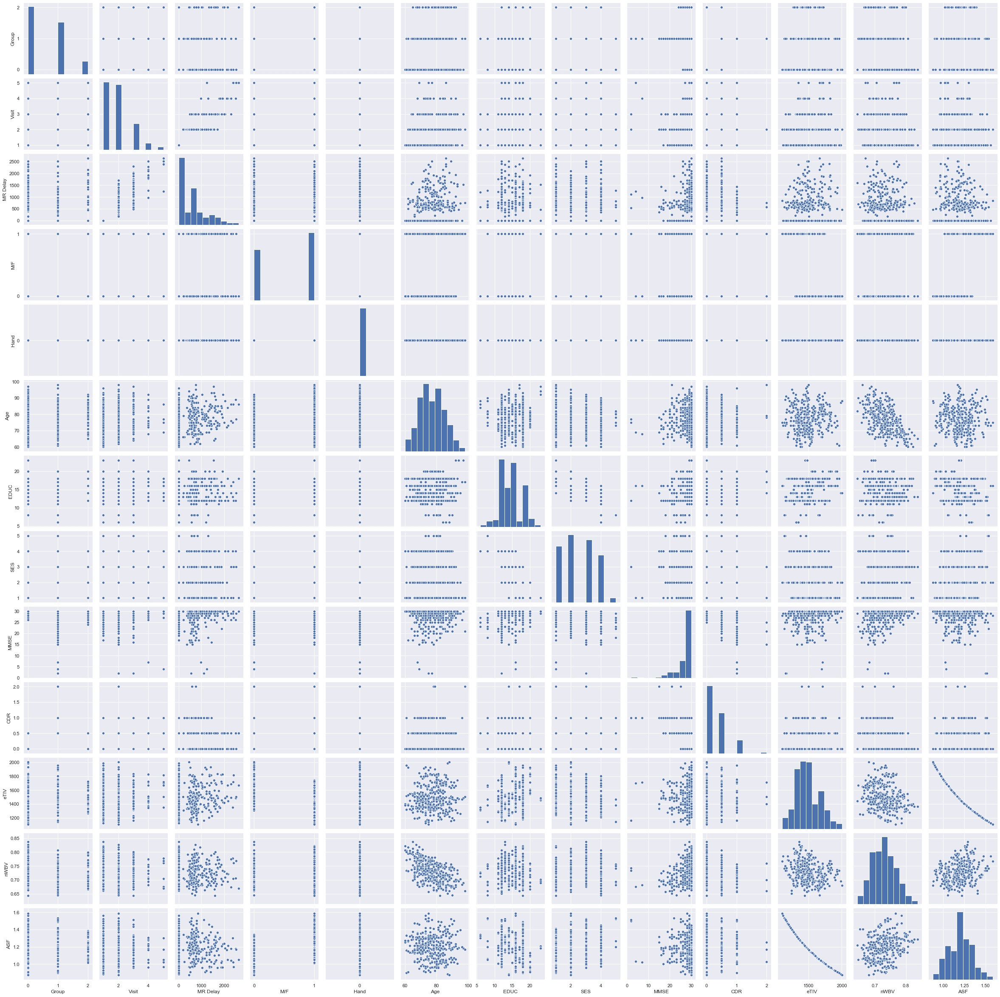

In [19]:
# Create pairplot
sns.pairplot(ol_fillna)

The pairplot provides a visual of how each attribute relates to the other. The noteworthy relationships to point out are:
- Age and Normalized Whole Brain Volume (nWBV)
- Socioeconomic Status (SES) and Education (EDUC)
- Normalized Whole Brain Volume (nWBV) and Estimated Total Intracranial Volume (eTIV)
- Normalized Whole Brain Volume (nWBV) and Atlast Scaling Factor (ASF)
- Estimated Total Intracranial Volume and Atlast Scaling Factor (ASF)

To confirm the validity of the above claims, correlation must be determined. The output of a correlation analysis will be a number between -1 and 1, and provides insights into the type of relationship (positive or negative) and how strong the relationship is. Prior to conducting a correlation analysis, it is important to test the normality of the data in order to understand whether to apply the pearson test (parametric) or spearman test (non-parametric).

In [20]:
# Conduct normality test
k2, p = scipy.stats.normaltest(ol_fillna['Visit'])
print("p_visit = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['MR Delay'])
print("p_mrdelay = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['Age'])
print("p_age = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['EDUC'])
print("p_educ = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['SES'])
print("p_ses = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['MMSE'])
print("p_mmse = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['CDR'])
print("p_cdr = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['eTIV'])
print("p_etiv = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['nWBV'])
print("p_nwbv = {:g}".format(p))
k2, p = scipy.stats.normaltest(ol_fillna['ASF'])
print("p_asf = {:g}".format(p))

p_visit = 4.46715e-13
p_mrdelay = 4.24223e-10
p_age = 0.0768767
p_educ = 0.977357
p_ses = 2.6456e-19
p_mmse = 1.73602e-55
p_cdr = 1.3394e-20
p_etiv = 0.000729656
p_nwbv = 0.0234679
p_asf = 0.514103


The null hypothesis here is that each attribute is normally distributed. Attributes that return  a p-value less than 0.05 from the normality test will reject the null hypothesis, meaning that they are considered not to be normally distributed. Based on the results above, Age, Education, and Atlas Scaling Factor are the only attributes that can be considered normally distributed. Because of this, we will assume that the data is non-parametric and thus use the Spearman correlation test for the correlation matrix.

In [21]:
corr = ol_fillna.corr(method='spearman') # Correlation matrix
corr.style.background_gradient(cmap='coolwarm').set_precision(2) # Styling

,Visit,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
Visit,1.00,0.94,0.19,0.03,-0.05,0.04,0.01,0.11,-0.14,-0.11
MR Delay,0.94,1.00,0.19,0.06,-0.04,0.08,-0.04,0.11,-0.11,-0.11
Age,0.19,0.19,1.00,-0.05,-0.04,-0.03,-0.04,0.05,-0.48,-0.05
EDUC,0.03,0.06,-0.05,1.00,-0.73,0.24,-0.21,0.23,-0.01,-0.23
SES,-0.05,-0.04,-0.04,-0.73,1.00,-0.20,0.12,-0.24,0.10,0.24
MMSE,0.04,0.08,-0.03,0.24,-0.20,1.00,-0.68,0.02,0.28,-0.02
CDR,0.01,-0.04,-0.04,-0.21,0.12,-0.68,1.00,0.03,-0.36,-0.03
eTIV,0.11,0.11,0.05,0.23,-0.24,0.02,0.03,1.00,-0.21,-1.00
nWBV,-0.14,-0.11,-0.48,-0.01,0.10,0.28,-0.36,-0.21,1.00,0.21
ASF,-0.11,-0.11,-0.05,-0.23,0.24,-0.02,-0.03,-1.00,0.21,1.00


The correlation matrix indicates that there is a strong positive correlation between MR Delay and Visit. This makes sense because the delay from the first visit naturally increases as the subject takes part in further visits. The matrix also indicates a strong negative correlation between Education (EDUC) and Socioeconomic Status (SES). This falls in line with our prior hypothesis when filling in missing SES values, that a higher level of education tends to lead to higher socioeconomic status. The matrix also points out a very strong negative correlation between the Estimated Total Intracranial Volume (eTIV) and the Atlas Scaling Factor (ASF). This is because the Atlas Scaling Factor is a calculated value that is actually based on Estimated Total Intracranial Volume. This will be noted for the Dimensionality Reduction step as Atlas Scaling Factor can likely be dropped. Another relationship to point out from the matrix is between Mini-Mental State Exam (MMSE) and Clinical Dementia Rating (CDR). The negative correlation between the two variables suggests that, as we would expected, a lower score on the Mini-Mental State Exam correlates to a higher likelihood of having dementia. Lastly, the matrix shows that there is a moderate negative correlation between Age and Normalized Whole Brain Volume. This could suggest that brain matter decays as one gets older.

## Step 2: Exploratory Data Analysis
In the Exploratory Analysis step, we will look at subsetting the data in different ways to understand if there are patterns or trends between attributes. Numerical value fields in the data set will also be normalized to a common scale. Furthermore, methods of clustering may be applied to determine if there are any logical groupings in the data.

### Sub-setting


#### Subject handedness:

In [22]:
# Pivot on handedness
pd.pivot_table(ol_fillna, index='Hand', values='Subject ID', aggfunc=lambda x: len(x.unique()))

,Subject ID
Hand,
0,150


All subjects are right-handed, therefore, this column could be removed in later steps due to no variance. <br />
#### MMSE scores by Group:

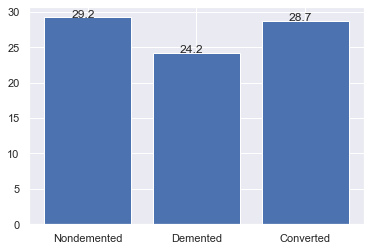

In [23]:
# Create pivot
mmse_by_group = pd.pivot_table(ol_fillna, index='Group', values=['MMSE'], aggfunc={'MMSE':np.mean})
pivot = mmse_by_group.reset_index() # Convert pivot to data frame

# Create bar chart
x = ['Nondemented', 'Demented', 'Converted'] # pivot['Group']
y = pivot['MMSE']
bars = plt.bar(x,y)
for bar in bars: # Add value labels
    yval = round(bar.get_height(),1)
    plt.text(bar.get_x()+0.25, yval + .005, yval)   
plt.show()

As expected, Nondemented subjects, on average, score higher on the Mini-Mental State Exam than the group of Demented subjects. The group of Converted subjects still scored high, potentially meaning the onset of Dementia could still be in the early stages. It is worth sub-setting and investigating the Converted Group further. <br />
#### Subsetting 'Converted' patients

In [24]:
# Filter on converted subjects
print('Filter on converted subjects:')
ol_fillna.loc[ol_fillna['Group']=="2",:].head()

Filter on converted subjects:


,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
33,OAS2_0018,OAS2_0018_MR1,2,1,0,1,0,87,14,1.0,30.0,0.0,1406,0.715,1.248
34,OAS2_0018,OAS2_0018_MR3,2,3,489,1,0,88,14,1.0,29.0,0.0,1398,0.713,1.255
35,OAS2_0018,OAS2_0018_MR4,2,4,1933,1,0,92,14,1.0,27.0,0.5,1423,0.696,1.234
36,OAS2_0020,OAS2_0020_MR1,2,1,0,0,0,80,20,1.0,29.0,0.0,1587,0.693,1.106
37,OAS2_0020,OAS2_0020_MR2,2,2,756,0,0,82,20,1.0,28.0,0.5,1606,0.677,1.093


In [25]:
# Filter on a single converted subject
print('Filter on a single converted subject:')
ol_fillna.loc[ol_fillna['Subject ID']=="OAS2_0018",:]

Filter on a single converted subject:


,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
33,OAS2_0018,OAS2_0018_MR1,2,1,0,1,0,87,14,1.0,30.0,0.0,1406,0.715,1.248
34,OAS2_0018,OAS2_0018_MR3,2,3,489,1,0,88,14,1.0,29.0,0.0,1398,0.713,1.255
35,OAS2_0018,OAS2_0018_MR4,2,4,1933,1,0,92,14,1.0,27.0,0.5,1423,0.696,1.234


Further subsetting of the Converted group shows that in the initial visit, the subjects are still labeled as converted, even though they are supposed to be 'Nondemented'. Therefore, the first visit for each subject in the 'Converted' Group should be modified to 'Nondemented', and the following visits should be modified to 'Demented'. At this point, the class variable will be updated to 0, if the subject is categorized as Nondemented, or 1 otherwise.

In [26]:
ol_class = ol_fillna.copy()

# Classify first visit of Converted subjects as 'Nondemented' and following visits as 'Demented'
ol_class.loc[(ol_class['Group']=='2') & (ol_class['Visit']==1), 'Group'] = '0'
ol_class.loc[(ol_class['Group']=='2') & (ol_class['Visit']>1), 'Group'] = '1'

It must be redetermined whether the class variable is balanced or imbalanced. There is currently a 54.7% to 45.3% split of class 0 to class 1 subjects. The class values are still relatively balance, thus no rebalancing will be done.

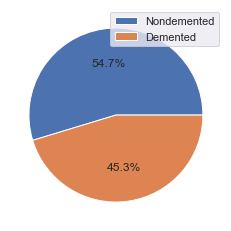

In [27]:
class_imbalance = pd.pivot_table(ol_class, index='Group', values='MRI ID', aggfunc=len)
pivot = class_imbalance.reset_index() # Convert pivot table to a data frame
labels = ['Nondemented', 'Demented'] # pivot.loc[:,'Group']
values = pivot.loc[:,'MRI ID']
patches, text, lab = plt.pie(values, autopct='%.1f%%') # Create the pie chart with value labels
plt.legend(patches, labels) # Create legend
plt.show()

#### MMSE by Clinical Dementia Rating
I wanted to understand if there was a relationship beyond Clinical Dementia Rating (CDR) and the Mini-Mental State Exam (MMSE) results, thus I decided to incorporate Normalized Whole Brain Volume (nWBV) into a scatter chart.

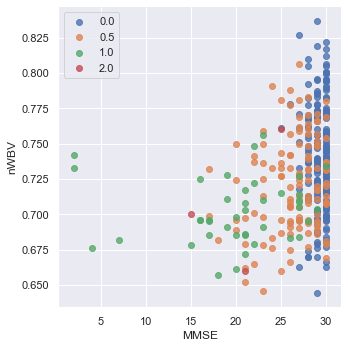

In [28]:
sns.lmplot('MMSE','nWBV', data=ol_class, fit_reg=False, hue='CDR', legend=False) # Create scatter
plt.legend(loc='upper left') # Position legend

The results are mostly inconclusive, but there are a few points to note. All subjects with a Clinical Dementia Rating of 0 have an MMSE score consistently above 25. Subjects with CDR greater than 0 are more spread in terms of MMSE score results. Another point to highlight is that subjects with a CDR greater or equal to 1, have consistently smaller Normalized Whole Brain Volumes.

### Normalization
Certain machine learning algorithms base results on distance measures, therefore the data must be normalized. The process of normalization converts numerical attributes to a scale between 0 and 1.

In [29]:
# Create a copy of data frame
ol_norm = ol_class.copy()

# Plug attribute names into normalization formula
X = 'Visit'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'MR Delay'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'Age'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'EDUC'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'SES'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'MMSE'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'CDR'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'eTIV'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'nWBV'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())
X = 'ASF'
ol_norm[X] = (ol_norm[X] - ol_norm[X].min()) / (ol_norm[X].max() - ol_norm[X].min())

print('Normalized dataset:')
ol_norm.head()

Normalized dataset:


,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,OAS2_0001,OAS2_0001_MR1,0,0.00,0.000000,0,0,0.710526,0.470588,0.25,0.892857,0.00,0.981069,0.269430,0.009845
1,OAS2_0001,OAS2_0001_MR2,0,0.25,0.173172,0,0,0.736842,0.470588,0.25,1.000000,0.00,1.000000,0.191710,0.000000
2,OAS2_0002,OAS2_0002_MR1,1,0.00,0.000000,0,0,0.394737,0.352941,0.50,0.750000,0.25,0.636971,0.476684,0.239100
3,OAS2_0002,OAS2_0002_MR2,1,0.25,0.212202,0,0,0.421053,0.352941,0.50,0.928571,0.25,0.703786,0.357513,0.188467
4,OAS2_0002,OAS2_0002_MR3,1,0.50,0.718075,0,0,0.526316,0.352941,0.50,0.714286,0.25,0.659243,0.295337,0.222222


### K-Means Clustering
K-Means clustering is used to determine the optimal grouping of a set of numerical data. It can be used to identify different groups of subjects in the MRI data. K-Means clustering will be applied on the normalized set of numerical attributes in the dataset. The results will then need to be denormalized in order to interpret the results.

In [30]:
# Create copy of data frame
ol_clust = ol_norm.copy()

# Remove non-numeric attributes
ol_clust = ol_clust.drop(['Subject ID', 'MRI ID', 'Group', 'M/F', 'Hand'], axis=1)
ol_clust.head()

,Visit,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,0.00,0.000000,0.710526,0.470588,0.25,0.892857,0.00,0.981069,0.269430,0.009845
1,0.25,0.173172,0.736842,0.470588,0.25,1.000000,0.00,1.000000,0.191710,0.000000
2,0.00,0.000000,0.394737,0.352941,0.50,0.750000,0.25,0.636971,0.476684,0.239100
3,0.25,0.212202,0.421053,0.352941,0.50,0.928571,0.25,0.703786,0.357513,0.188467
4,0.50,0.718075,0.526316,0.352941,0.50,0.714286,0.25,0.659243,0.295337,0.222222


In [31]:
# Run k-Means with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=1)
kmeans.fit(ol_clust)
y_kmeans = kmeans.predict(ol_clust)

# Produce cluster centers
results = kmeans.cluster_centers_
clusters = pd.DataFrame(data=results[0:, 0:], index=['Cluster 1', 'Cluster 2', 'Cluster 3'],columns=['Visit', 'MR Delay', 'Age', 'EDUC', 'SES','MMSE', 'CDR', 'eTIV', 'nWBV', 'ASF'])

# De-normalize the values
X = 'Visit'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'MR Delay'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'Age'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'EDUC'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'SES'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'MMSE'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'CDR'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'eTIV'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'nWBV'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()
X = 'ASF'
clusters[X] = (ol_fillna[X].max() - ol_fillna[X].min()) * clusters[X] + ol_fillna[X].min()

# Show cluster results in tabular form
clusters

,Visit,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
Cluster 1,1.500000,336.023437,76.468750,16.750000,1.523438,27.906250,0.230469,1564.375000,0.728445,1.135531
Cluster 2,3.347826,1608.623188,79.637681,15.260870,2.173913,28.217391,0.188406,1553.028986,0.723913,1.143116
Cluster 3,1.585227,386.181818,76.380682,12.772727,3.295455,26.301136,0.375000,1407.232955,0.732602,1.259568


The result of the K-Means clustering returns 3 different groups of subjects. While there are some similarities between clusters, there are attributes that delineate clear differences. For the attribute Visit, the values for Cluster 1 (1.5) and Cluster 3 (1.58) could infer 1-2 visits, while the value of Cluster 2 (3.34) could represent 3 or more visits. For MR Delay, the values of Cluster 1 (336.02) and Cluster 3 (386.18) could represent 1 year delay between visits, while Cluster 2 (1608.62) could represent 4-5 years. For Education, it could be assumed that Cluster 1 (16.75) and Cluster 2 (15.26) indicate post-secondary level education, while Cluster 3 (12.77) indicates high school level education. Each of the Socioeconomic values for Cluster 1 (1.52), Cluster 2 (2.17) and Cluster 3 (3.29), could represent upper class, upper-middle class, and middle class respectively. For estimated total intracranial volume, it can be assumed that the values for Cluster 1 (1564.38) and Cluster 2 (1553.03) are average, while the value for cluster 3 (1407.23) is below average. For the remaining attributes, Age, MMSE, CDR, nWBV and ASF, the values between clusters are largely similar, thus they will be ignored in the group classification process.

The final clusters are are as follows:

- **Cluster 1**: Subjects with 1-2 visits within 1 year, who have a post-secondary education, who are upper class and have an average intracranial volume.
- **Cluster 2**: Subjects with 3+ visits within 4-5 years, who have a post-secondary education, who are upper-middle class and have an average intracranial volume.
- **Cluster 3**: Subjects with 1-2 visits within 1 year, who have a high school education, who are middle class and have a less than average intracranial volume.

## Step 3: Dimensionality Reduction
Feature selection is a technique used in the Dimensionality Reduction step to decide important attributes from others. In this step, we are looking to remove attributes that have low variance and attributes that are highly correlated. The goal is to narrow down the dataset to a smaller size to optimize speed and reduce noise in the analysis.

Right off the bat, we will remove the ID fields, Subject ID and MRI ID, since they are essentially unique across the entire dataset. We also want to remove MR Delay and Visit since they are random and do not help to classify dementia. 

In [179]:
# Save as new Data Frame
ol_reduc = ol_norm.copy()

# Drop attributes Subject ID, MRI ID, MR Delay and Visit
ol_reduc = ol_reduc.drop(['Subject ID', 'MRI ID', 'MR Delay', 'Visit'], axis=1)
ol_reduc.head()

,Group,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,0,0,0,0.710526,0.470588,0.25,0.892857,0.00,0.981069,0.269430,0.009845
1,0,0,0,0.736842,0.470588,0.25,1.000000,0.00,1.000000,0.191710,0.000000
2,1,0,0,0.394737,0.352941,0.50,0.750000,0.25,0.636971,0.476684,0.239100
3,1,0,0,0.421053,0.352941,0.50,0.928571,0.25,0.703786,0.357513,0.188467
4,1,0,0,0.526316,0.352941,0.50,0.714286,0.25,0.659243,0.295337,0.222222


### Correlated Attributes
When highly correlated attributes are encountered, typically all but one are removed. The reason is to reduce redundancy in an analysis since correlated attributes will likely have a similar effect on the class variable. From the prior spearman correlation analysis, it was seen that the Estimated Total Intracranial Volume (eTIV) and Atlas Scaling Factor (ASF) were perfectly correlated. Thus, it is decided that the ASF attribute will be removed from the analysis. ASF was chosen over eTIV because it is a calculated field that is based off of eTIV.

In [33]:
# Drop attribute ASF
ol_reduc = ol_reduc.drop(['ASF'], axis=1)
ol_reduc.head()

,Group,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV
0,0,0,0,0.710526,0.470588,0.25,0.892857,0.00,0.981069,0.269430
1,0,0,0,0.736842,0.470588,0.25,1.000000,0.00,1.000000,0.191710
2,1,0,0,0.394737,0.352941,0.50,0.750000,0.25,0.636971,0.476684
3,1,0,0,0.421053,0.352941,0.50,0.928571,0.25,0.703786,0.357513
4,1,0,0,0.526316,0.352941,0.50,0.714286,0.25,0.659243,0.295337


### Low Variance Filter
A low variance filter is used to remove attributes with low variance. This is done because attributes with low variance tend not to provide much information on the class attribute, and thus, do not improve the performance of the model. In the case below, it can be seen that Hand has 0 variance; and this makes sense since each subject tested is right handed. Therefore Hand should be dropped. Because the rest of the attributes contain similar variances, it is concluded that none of the remaining attributes have a low enough variance to be removed.

In [34]:
# Convert M/F and Hand to integers in order to calculate variance
ol_reduc['M/F'] = ol_reduc['M/F'].astype('int64')
ol_reduc['Hand'] = ol_reduc['Hand'].astype('int64')

# Calculate variance
ol_reduc.var()

M/F     0.245611
Hand    0.000000
Age     0.040432
EDUC    0.028627
SES     0.077134
MMSE    0.021591
CDR     0.035073
eTIV    0.038473
nWBV    0.037021
dtype: float64

In [35]:
# Drop attribute Hand
ol_reduc = ol_reduc.drop(['Hand'], axis=1)

In [36]:
# ol_lowvar = ol_reduc.copy()
# X = ol_lowvar[['Visit','MR Delay','Age','EDUC','SES','MMSE','CDR','eTIV','nWBV']]
# T = .03
# sel = VarianceThreshold(threshold=(T*(1-T)))
# sel.fit_transform(X)
# X.loc[:, sel.get_support()]

### Univariate Analysis - Feature Dependence
Univariate features selection is a technique used in feature selection to select attributes that are dependent together with the class variable. The goal is to remove any attributes that are independent of the class variable.

There is a python package called sklearn, which allows one to conduct a univariate analysis on a dataset and returns the K best attributes based on a score. In the instance below, it was decided to score the dependency level based on the Chi squared test. The higher the Chi squared value/score, the greater the dependency between that attribute and the class variable. It was also decided that all attributes would be returned, and then certain attributes removed manually thereafter.

In [37]:
# Assign data to variable X, and class variable to y
y = ol_reduc.iloc[:,0]
X = ol_reduc.iloc[:,1:]

# Run univariate analysis
fit = SelectKBest(chi2, k=8).fit(X, y)

# Load results to Data Frames
scores = pd.DataFrame(fit.scores_)
columns = pd.DataFrame(X.columns)
feature_scores = pd.concat([columns, scores], axis=1)
feature_scores.columns = ['Attribute', 'Chi2']
feature_scores.sort_values(by='Chi2', ascending=False)

,Attribute,Chi2
5,CDR,62.216399
0,M/F,9.597208
7,nWBV,3.369986
4,MMSE,2.625953
3,SES,1.133013
2,EDUC,0.912625
6,eTIV,0.015571
1,Age,0.001437


The results of the univariate analysis above indicates that the most dependent attributes are CDR, M/F, and nWBV, while the most independent attributes are Age, eTIV, and EDUC. In the interest of not over-reducing the dataset, only the Age attribute will be removed.

In [193]:
ol_reduc = ol_reduc.drop(['Age'], axis=1)
ol_reduc.head()

,Group,M/F,Hand,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,0,0,0,0.470588,0.25,0.892857,0.00,0.981069,0.269430,0.009845
1,0,0,0,0.470588,0.25,1.000000,0.00,1.000000,0.191710,0.000000
2,1,0,0,0.352941,0.50,0.750000,0.25,0.636971,0.476684,0.239100
3,1,0,0,0.352941,0.50,0.928571,0.25,0.703786,0.357513,0.188467
4,1,0,0,0.352941,0.50,0.714286,0.25,0.659243,0.295337,0.222222


## Step 4: Experiemental Design
The first step in the Experimental Design stage is to define training and test sets. Instead of using a traditional training/test split, a method called 10-fold cross validation will be used to evaluate models. In this method, the dataset is separated into 10 distinct folds of equal sizes. Each model is validated throughout 10 iterations, each one using 9 out of 10 folds to train, and the remaining fold to test.

[insert image here]

The second step in Experimental Design is to balance the dataset if the class variable is imbalanced, that is, if there is a significant difference in the proportion of Demented versus Nondemented patients. As seen previously, there is currently a 54.7% to 45.3% split of class 0 (Nondemented) to class 1 (Demented) subjects. Since the values are relatively equal, no balancing will be appplied.

In [194]:
# Assign data to variable X, and class variable to y
y = np.array(ol_reduc.iloc[:,0])
X = np.array(ol_reduc.iloc[:,1:])

kf = KFold(n_splits=10) # Define the number of folds

# Print indexes of the folds
for train_index, test_index in kf.split(X, y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

TRAIN: [ 38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73
  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91
  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109
 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127
 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145
 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163
 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181
 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199
 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217
 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235
 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253
 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271
 272 273 274 275 276 277 278 279 280 281 282

## Step 5: Modelling
This step is where classification and regression algorithms will be applied on the training sets. Logistic Regression, Naive Bayes classification, Decision Tree and Random Forest classification will be used. The purpose of this step is to generate classification models that can be used to predict whether a patient is at risk of Dementia.

### Logistic Regression 
#### Logistic Regression Trial 1
Logistic regression is a classification method that is based on the Sigmoid function, an "S-shaped" function in statistics, that determines the probability of the outcome of a binary class variable based on a number of independent variables. Because the class variable is binary, Nondemented (0) or Demented (1), logistic regression can be used as a model.

In logistic regression, it is important to ensure categorical attributes, such as M/F (Male/Female), are assigned the appropriate data type since the regression model may take a female value of "1" as being greater than the male value of 0, when it is not true.

https://towardsdatascience.com/building-a-logistic-regression-in-python-step-by-step-becd4d56c9c8<br/>
https://machinelearningmastery.com/logistic-regression-for-machine-learning/

As described in the previous step, the logistic regression model below (and any model thereafter) is trained and tested using the cross validation method. Therefore, there are 10 separate outputs per iteration. To best illustrate how the model is trained and tested, cross validation was applied using both a python package and manually. The score (accuracy) output matches between both methods.

In [196]:
# Ensure that M/F is a category
ol_reduc['M/F'] = ol_reduc['M/F'].astype('category')

# Assign independent data to variable X, and dependent data to variable y
y = np.array(ol_reduc.iloc[:,0])
X = np.array(ol_reduc.iloc[:,1:])

# Define and fit the model
model = LogisticRegression(random_state=1)
model.fit(X, y)
kf = KFold(n_splits=10) # Define the number of folds

# Display accuracy of each fold
lr_scores = cross_val_score(model, X, y, cv=10)
print('Linear Regression accuracy by fold:\n', lr_scores, '\n')
# print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

# Display the coefficients and intercepts
print('Coefficients:\n', model.coef_, '\n')
print('Intercept:\n', model.intercept_, '\n')

# Run the Model manually
for train_index, test_index in kf.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Save predicted and true values
    lr_prediction = y_pred.astype(np.int)
    lr_true = y_test.astype(np.int)

    # Evaluate the model
    print('Confusion Matrix:\n', confusion_matrix(lr_true, lr_prediction))
    print('\nClassification Report:\n', classification_report(lr_true, lr_prediction))

Linear Regression accuracy by fold:
 [0.92105263 0.97368421 0.97368421 1.         1.         1.
 0.97297297 0.94594595 1.         0.97297297] 

Coefficients:
 [[-0.88889753  0.         -0.96877849 -0.06628838 -2.68659929  8.00897577
  -0.83437372 -1.27669104  0.66634809]] 

Intercept:
 [2.83960327] 

Confusion Matrix:
 [[19  2]
 [ 1 16]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93        21
           1       0.89      0.94      0.91        17

    accuracy                           0.92        38
   macro avg       0.92      0.92      0.92        38
weighted avg       0.92      0.92      0.92        38

Confusion Matrix:
 [[21  0]
 [ 1 16]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.98        21
           1       1.00      0.94      0.97        17

    accuracy                           0.97        38
   macro avg       0.98    

In [225]:
# Format coefficients
cols = list(ol_reduc.iloc[:,1:])
coefficients = pd.DataFrame(model.coef_, columns=cols)#.T
coefficients
# coefficients.sort_values(by=0, ascending=0)

,M/F,Hand,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,-0.854378,0.0,-1.19739,-0.070312,-2.592191,7.594432,-0.984119,-0.946229,0.704847


Becase the result of each iteration present such a high accuracy (between 90% to 100%), there is a potential case of overfitting. Based on the coefficients of the logistic regerssion model, CDR and MMSE seem to be large predictors of dementia, meaning these two attributes may have been used to categorize the class variable to begin with. To mitigate the risk of overfitting, CDR and MMSE will be removed from the training and test sets.

#### Linear Regression Trial 2
The second trial operates on the same dataset without the CDR and MMSE attributes. The accuracy of each fold falls between 52% and 87% which is more realistic.

In [157]:
# Drop CDR and MMSE
ol_rev = ol_reduc.copy()
ol_rev = ol_rev.drop(['CDR', 'MMSE'], axis=1)

# Assign independent data to variable X, and dependent data to variable y
y_rev = np.array(ol_rev.iloc[:,0])
X_rev = np.array(ol_rev.iloc[:,1:])

# Define and fit the model
model = LogisticRegression(random_state=1)
model.fit(X_rev, y_rev)
kf = KFold(n_splits=10) # Define the number of folds

# Display accuracy of each fold
lr2_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print('Linear Regression accuracy by fold:\n', lr2_scores, '\n')
print("Accuracy: %0.2f (+/- %0.2f)" % (lr2_scores.mean(), lr2_scores.std() * 2), '\n')

# Display the coefficients and intercepts
print('Coefficients:\n', model.coef_, '\n')
print('Intercept:\n', model.intercept_, '\n')

# ROC curve
# lr_roc_auc = roc_auc_score(y_rev.astype(np.int), model.predict(X_rev.astype(np.int)))
# fpr, tpr, thresholds = roc_curve(y_rev.astype(np.int), model.predict_proba(X_rev.astype(np.int))[:,1])
# plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % lr_roc_auc)
# plt.plot([0, 1], [0, 1],'r--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver operating characteristic')
# plt.legend(loc="lower right")
# plt.savefig('Log_ROC')
# plt.show()

Linear Regression accuracy by fold:
 [0.52631579 0.86842105 0.73684211 0.64864865 0.64864865 0.62162162
 0.59459459 0.54054054 0.7027027  0.67567568] 

Accuracy: 0.66 (+/- 0.19) 

Coefficients:
 [[-1.21690912 -1.77790674  0.143256   -1.61578337 -2.63668121]] 

Intercept:
 [3.19086389] 



#### Trial 3
In order to try and improve accuracy further we add the Age attribute back to the training and test set. Adding hand back has improved the accuracy from 66% to 69%.

In [162]:
# Add Age attribute back
ol_rev2 = pd.concat([ol_rev, ol_norm['Age']], axis=1)

# Assign independent data to variable X, and dependent data to variable y
y_rev2 = np.array(ol_rev2.iloc[:,0])
X_rev2 = np.array(ol_rev2.iloc[:,1:])

# Define and fit the model
model = LogisticRegression(random_state=1)
model.fit(X_rev2, y_rev2)
kf = KFold(n_splits=10) # Define the number of folds

# Display accuracy of each fold
lr3_scores = cross_val_score(model, X_rev2, y_rev2, cv=10)
print('Linear Regression accuracy by fold:\n', lr3_scores, '\n')
print("Accuracy: %0.2f (+/- %0.2f)" % (lr3_scores.mean(), lr3_scores.std() * 2), '\n')

# Display the coefficients and intercepts
print('Coefficients:\n', model.coef_, '\n')
print('Intercept:\n', model.intercept_, '\n')

Linear Regression accuracy by fold:
 [0.60526316 0.89473684 0.73684211 0.75675676 0.67567568 0.64864865
 0.59459459 0.54054054 0.75675676 0.67567568] 

Accuracy: 0.69 (+/- 0.19) 

Coefficients:
 [[-1.14949627 -1.81675538  0.11524177 -1.59192474 -3.09801868 -1.12916768]] 

Intercept:
 [3.88241706] 



### Decision Tree
#### Decision Tree Trial 1
The decision tree is a classification algorithm that essentially creates a decision process for predicting the outcome of a dependent variable. It creates a decision point (called a node) for each attribute and prioritizesattributes that are most important (have higher information gain) at the beginning of the classification process. 

https://stackabuse.com/decision-trees-in-python-with-scikit-learn/

In [108]:
# Assign independent data to variable X, and dependent data to variable y
y = np.array(ol_reduc.iloc[:,0])
X = np.array(ol_reduc.iloc[:,1:])

# Define and fit the model
model = DecisionTreeClassifier(criterion='entropy', random_state=1)
model.fit(X, y)

# Display accuracy of each fold
dt_scores = cross_val_score(model, X, y, cv=10)
print(dt_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (dt_scores.mean(), dt_scores.std() * 2))

# Load header names into a list
feature_cols = list(ol_reduc.iloc[:,1:])

# Save the visual as png
export_graphviz(model, out_file='tree.dot', feature_names = feature_cols, class_names = ['0','1'], 
                rounded = True, proportion = False, precision = 2, filled = True)
!dot -Tpng tree.dot -o tree.png -Gdpi=600

# Display tree
Image(filename = 'tree.png')

[0.92105263 0.97368421 0.97368421 0.97297297 1.         0.97297297
 1.         0.91891892 1.         0.94594595]
Accuracy: 0.97 (+/- 42.67)


It can be seen that, once again, CDR and MMSE are large predictors of dementia given their high entropy values, therefore both attributes will be removed here and throughout each following model.

#### Decision Tree Trial 2
The accuracy has reduced to 61% in this trial though it is more realistic.

In [109]:
# Define and fit the model
model = DecisionTreeClassifier(criterion='entropy', max_depth=7, random_state=1)
model.fit(X_rev, y_rev)

# Display accuracy of each fold
dt2_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print(dt2_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (dt2_scores.mean(), dt2_scores.std() * 2))

# Load header names into a list
feature_cols = list(ol_revised.iloc[:,1:])

# Save the visual as png
export_graphviz(model, out_file='tree2.dot', feature_names = feature_cols, class_names = ['0','1'], 
                rounded = True, proportion = False, precision = 2, filled = True)
!dot -Tpng tree2.dot -o tree2.png -Gdpi=600

# Display tree
Image(filename = 'tree2.png')

[0.44736842 0.71052632 0.47368421 0.7027027  0.72972973 0.64864865
 0.56756757 0.64864865 0.67567568 0.48648649]
Accuracy: 0.61 (+/- 0.20)


#### Decision Tree Trial 3
It is known that as the depth of the decision tree increases, the risk of overfitting also increases. Therefore, in this trial, we limit the depth of the decision tree to 5 levels. With 5 levels, we can see that an accuracy of 60% is achieved, 1% less than the previous trial. Although it has performed worse, there is less chance of overfitting, thus Trial 3 would be chosen over Trial 1 and 2.

In [110]:
# Define and fit the model
model = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=1)
model.fit(X_rev, y_rev)

# Display accuracy of each fold
dt3_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print(dt3_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (dt3_scores.mean(), dt3_scores.std() * 2))

# Load header names into a list
feature_cols = list(ol_revised.iloc[:,1:])

# Save the visual as png
export_graphviz(model, out_file='tree3.dot', feature_names = feature_cols, class_names = ['0','1'], 
                rounded = True, proportion = False, precision = 2, filled = True)
!dot -Tpng tree3.dot -o tree3.png -Gdpi=600

# Display tree
Image(filename = 'tree3.png')

[0.52631579 0.73684211 0.42105263 0.64864865 0.81081081 0.56756757
 0.56756757 0.56756757 0.59459459 0.54054054]
Accuracy: 0.60 (+/- 0.21)


#### Decision Tree Trial 4
In this trial we add the Age attribute back. The accuracy has reduced to 59%. In this instance we would prefer Trial 3 as it is more accurate and uses less attributes. Decision Tree Trial 3 will move forward to the evaluation phase.

In [168]:
# Define and fit the model
model = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=1)
model.fit(X_rev2, y_rev2)

# Display accuracy of each fold
dt4_scores = cross_val_score(model, X_rev2, y_rev2, cv=10)
print(dt4_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (dt4_scores.mean(), dt4_scores.std() * 2))

[0.47368421 0.5        0.47368421 0.62162162 0.75675676 0.67567568
 0.64864865 0.62162162 0.56756757 0.59459459]
Accuracy: 0.59 (+/- 0.17)


### Random Forest  
#### Random Forest Trial 1
The random forest classification algorithm is based off the decision tree algorithm. The random forecast classifier runs multiple decision trees and aggregates the results based on a ranking system. Random forest classification tends to be equally or more accurate than a decision tree.

https://towardsdatascience.com/understanding-random-forest-58381e0602d2

In [111]:
# Define and fit the model
model = RandomForestClassifier(random_state=1)
model.fit(X_rev, y_rev)

# Display accuracy of each fold
rf_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print(rf_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (rf_scores.mean(), rf_scores.std() * 2))

[0.47368421 0.71052632 0.71052632 0.64864865 0.72972973 0.56756757
 0.43243243 0.59459459 0.75675676 0.64864865]
Accuracy: 0.63 (+/- 0.21)


#### Random Forest  Trial 2
Similar to the decision tree, we attempt to limit the depth of each tree in the forest to 5 levels. With 5 levels, we can see that an accuracy of 62% is achieved, only 1% less than the previous trial. Although it has performed worse, there is less chance of overfitting, thus Trial 2 would be chosen over Trial 1.

In [112]:
# Define and fit the model
model = RandomForestClassifier(max_depth=5, random_state=1)
model.fit(X_rev, y_rev)

# Display accuracy of each fold
rf2_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print(rf2_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (rf2_scores.mean(), rf2_scores.std() * 2))

[0.47368421 0.57894737 0.76315789 0.59459459 0.72972973 0.59459459
 0.48648649 0.62162162 0.72972973 0.64864865]
Accuracy: 0.62 (+/- 0.19)


#### Random Forest Trial 3
In this trial we add the Age attribute back in. The accuracy in this trial has improved to 63%, so this model will be used in the evaluation phase.

In [169]:
# Define and fit the model
model = RandomForestClassifier(max_depth=5, random_state=1)
model.fit(X_rev2, y_rev2)

# Display accuracy of each fold
rf3_scores = cross_val_score(model, X_rev2, y_rev2, cv=10)
print(rf3_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (rf3_scores.mean(), rf3_scores.std() * 2))

[0.5        0.55263158 0.78947368 0.56756757 0.78378378 0.59459459
 0.45945946 0.64864865 0.72972973 0.7027027 ]
Accuracy: 0.63 (+/- 0.22)


### Naïve Bayes Classifier
#### Naïve Bayes Trial 1
The Naïve Bayes algorithm is based on Bayes’ Theorem, which is a theorem that expresses the probability of an event based on the prior probability of another factor. The Naïve Bayes classifier specializes on datasets with attributes that are independent of each other. Because of the assumption that all attributes are of equal importance, the Naïve Bayes method is very fast and requires low storage requirements.

https://jakevdp.github.io/PythonDataScienceHandbook/05.05-naive-bayes.html

In [171]:
# Define and fit the model
model = GaussianNB()
model.fit(X_rev, y_rev)

# Display accuracy of each fold
nb_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print(nb_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (nb_scores.mean(), nb_scores.std() * 2))

[0.44736842 0.76315789 0.76315789 0.67567568 0.64864865 0.59459459
 0.54054054 0.56756757 0.72972973 0.78378378]
Accuracy: 0.65 (+/- 0.21)


#### Naïve Bayes Trial 2
In this trial we add the Age attribute back in. The accuracy in this trial stays the same, so Trial 1 will be used in the evaluation phase.

In [172]:
# Define and fit the model
model = GaussianNB()
model.fit(X_rev2, y_rev2)

# Display accuracy of each fold
nb2_scores = cross_val_score(model, X_rev2, y_rev2, cv=10)
print(nb2_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (nb2_scores.mean(), nb2_scores.std() * 2))

[0.47368421 0.68421053 0.76315789 0.64864865 0.62162162 0.59459459
 0.56756757 0.64864865 0.72972973 0.75675676]
Accuracy: 0.65 (+/- 0.17)


### K-Nearest Neighbor (kNN)
K-Nearest Neighbor is another classification algorithm. It predicts the class of an independent variable using the most common results from the K closest data points (hence nearest neighbors). The number of nearest neighbors, K, is defined by the data scientist and will typically take the value of an odd number since it is impossible to have a tie in a binary classification problem like this one. There is no optimal number for K; a lower value will tend to produce worse results due to noise in the data, while a higher value will tend to product better results with the risk of overfitting. Therefore, we will attempt two trials of kNN, with K = 3 and K = 5.

https://www.datacamp.com/community/tutorials/k-nearest-neighbor-classification-scikit-learn

#### K = 3

In [113]:
# Define and fit the model
model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_rev, y_rev)


# Display accuracy of each fold
kn3_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print(kn3_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (kn3_scores.mean(), kn3_scores.std() * 2))

[0.57894737 0.42105263 0.63157895 0.51351351 0.51351351 0.48648649
 0.45945946 0.56756757 0.75675676 0.62162162]
Accuracy: 0.56 (+/- 0.19)


In [153]:
# Define and fit the model
model = RandomForestClassifier(max_depth=5, random_state=1)
model.fit(X_rev2, y_rev2)

# Display accuracy of each fold
rf2_scores = cross_val_score(model, X_rev2, y_rev2, cv=10)
print(rf2_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (rf2_scores.mean(), rf2_scores.std() * 2))

[0.5        0.55263158 0.78947368 0.56756757 0.78378378 0.59459459
 0.45945946 0.64864865 0.72972973 0.7027027 ]
Accuracy: 0.63 (+/- 0.22)


#### K = 5

In [173]:
# Define and fit the model
model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_rev, y_rev)
kf = KFold(n_splits=10) # Define the number of folds

# Display accuracy of each fold
kn5_scores = cross_val_score(model, X_rev, y_rev, cv=10)
print(kn5_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (kn5_scores.mean(), kn5_scores.std() * 2))

[0.57894737 0.39473684 0.63157895 0.62162162 0.37837838 0.43243243
 0.45945946 0.51351351 0.72972973 0.62162162]
Accuracy: 0.54 (+/- 0.22)


#### K = 3 (with Age)
Based on the accurcies, we will use kNN with K = 3 using the Age attribute since the output results in improved accuracy.

In [175]:
# Define and fit the model
model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_rev2, y_rev2)
kf = KFold(n_splits=10) # Define the number of folds

# Display accuracy of each fold
kn3h_scores = cross_val_score(model, X_rev2, y_rev2, cv=10)
print(kn3h_scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (kn3h_scores.mean(), kn3h_scores.std() * 2))

[0.65789474 0.55263158 0.71052632 0.59459459 0.48648649 0.54054054
 0.48648649 0.7027027  0.81081081 0.81081081]
Accuracy: 0.64 (+/- 0.23)


## Step 6: Evaluation
In this step, the results of the models from the Modeling step will be evaluated against the test set. The performance of each algorithm will be measured by a confusion matrix, measuring accuracy, precision and recall. Non-parametric tests will be used to measure whether there is a statistically significant difference between the performance of each model.

Will use Friedman test to compare accuracies since the data is non-parametric, there are more than two samples, and the tests are paired (trained and tested on the same folds).

https://machinelearningmastery.com/nonparametric-statistical-significance-tests-in-python/

In [176]:
accuracy = pd.DataFrame((lr3_scores, nb_scores, dt3_scores, rf3_scores, kn3h_scores)).T
accuracy.columns = ['Linear Regression','Naive Bayes','Decision Tree', 'Random Forest', 'kNN']
accuracy

,Linear Regression,Naive Bayes,Decision Tree,Random Forest,kNN
0,0.605263,0.447368,0.473684,0.500000,0.657895
1,0.894737,0.763158,0.500000,0.552632,0.552632
2,0.736842,0.763158,0.473684,0.789474,0.710526
3,0.756757,0.675676,0.621622,0.567568,0.594595
4,0.675676,0.648649,0.756757,0.783784,0.486486
5,0.648649,0.594595,0.675676,0.594595,0.540541
6,0.594595,0.540541,0.648649,0.459459,0.486486
7,0.540541,0.567568,0.621622,0.648649,0.702703
8,0.756757,0.729730,0.567568,0.729730,0.810811
9,0.675676,0.783784,0.594595,0.702703,0.810811


In [177]:
means = pd.DataFrame((lr3_scores.mean(), nb_scores.mean(), dt3_scores.mean(),
                      rf3_scores.mean(), kn3h_scores.mean())).T
means.columns = ['Linear Regression','Naive Bayes','Decision Tree', 'Random Forest', 'kNN']
means

,Linear Regression,Naive Bayes,Decision Tree,Random Forest,kNN
0,0.688549,0.651422,0.593385,0.632859,0.635349


In [178]:
# Compare samples
stat, p = friedmanchisquare(lr3_scores, nb_scores, dt3_scores, rf3_scores, kn3h_scores)
print('Statistics=%.3f, p=%.3f' % (stat, p))

# Interpret
alpha = 0.05
if p > alpha:
    print('Distribution means are equal (fail to reject H0)')
else:
    print('Distribution means are different (reject H0)')

Statistics=1.726, p=0.786
Distribution means are equal (fail to reject H0)


Based on the Friedman test, there is no statistically significant difference in the mean accuracy of each model, so it cannot be confirmed that one model is better than the other.

## References

Marcus, D. S., Fotenos, A. F., Csernansky, J. G., Morris, J. C., & Buckner, R. L. (2010). Open
    Access Series of Imaging Studies: Longitudinal MRI Data in Nondemented and
    Demented Older Adults. Journal of Cognitive Neuroscience, 22(12), 2677-2684. doi:
    10.1162/jocn.2009.21407